<a href="https://www.kaggle.com/code/shanehussey/breat-cancer-model-accuracy-0-99415?scriptVersionId=140747188" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [39]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load


import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/breast-cancer-dataset/breast-cancer.csv


In [72]:
cancer_data_raw = pd.read_csv('/kaggle/input/breast-cancer-dataset/breast-cancer.csv')
cancer_data_raw

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [41]:
cancer_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [42]:
# lets assess the distributions of our features
plt.figure(figsize=(20,15))
sns.pairplot(cancer_data_raw)

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 2000x1500 with 0 Axes>

In [84]:
# Initial Data Cleaning
# lets copy our dataframe to one names clean instead of raw
cancer_data_clean = cancer_data_raw.copy()

# lets convert our 'diagnosis' feature to 0 for Beneign and 1 for Malignent 
cancer_data_clean['diagnosis'] = cancer_data_clean['diagnosis'].apply(lambda x: 1 if x == 'M' else 0)

# lets remove 'id' as this would typically be irrelevent to diagnostics
cancer_data_clean = cancer_data_clean.drop(['id'], axis=1)


<Axes: >

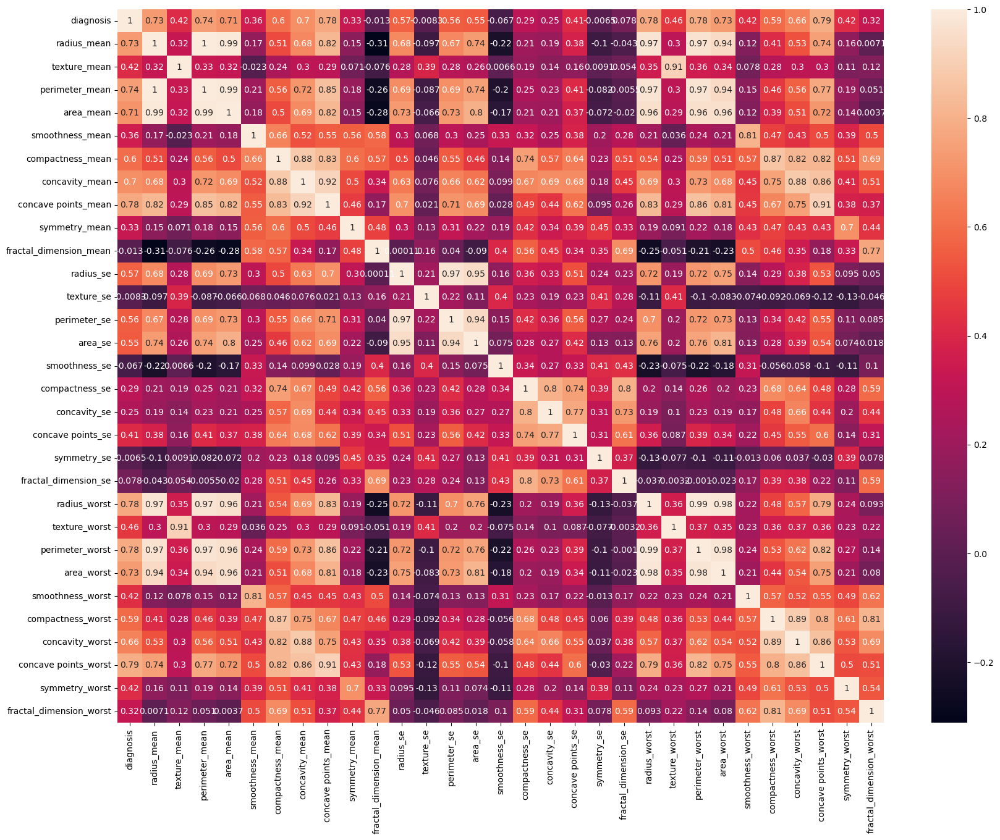

In [56]:
# lets assess the pearson's correlation coeffiencts of our features
plt.figure(figsize=(20,15))
sns.heatmap(cancer_data_clean.corr(),annot=True)

<Axes: ylabel='diagnosis'>

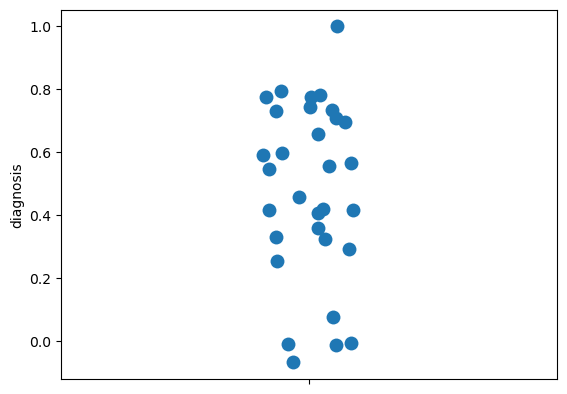

In [57]:
# lets make a scatterplot of how diagnosis correlates with all of our features
sns.stripplot(cancer_data_clean.corr()['diagnosis'],size=10)

In [58]:
# Print the 
cancer_data_clean.corr()['diagnosis'].sort_values(ascending=False)

diagnosis                  1.000000
concave points_worst       0.793566
perimeter_worst            0.782914
concave points_mean        0.776614
radius_worst               0.776454
perimeter_mean             0.742636
area_worst                 0.733825
radius_mean                0.730029
area_mean                  0.708984
concavity_mean             0.696360
concavity_worst            0.659610
compactness_mean           0.596534
compactness_worst          0.590998
radius_se                  0.567134
perimeter_se               0.556141
area_se                    0.548236
texture_worst              0.456903
smoothness_worst           0.421465
symmetry_worst             0.416294
texture_mean               0.415185
concave points_se          0.408042
smoothness_mean            0.358560
symmetry_mean              0.330499
fractal_dimension_worst    0.323872
compactness_se             0.292999
concavity_se               0.253730
fractal_dimension_se       0.077972
symmetry_se               -0

In [124]:
# lets check for skew in our data
skew = cancer_data_clean.skew().sort_values(ascending=False)
print("Raw Skew Values:\n",skew,sep="")

# we will log transform features that have a skew > 0.5
skew_threshold = 0.5
skewed_features = skew[(skew > skew_threshold)].index
# lets make sure diagnosis is not in this list
skewed_features = skewed_features.drop(['diagnosis'])
# What are our skewed features? 
print("Skewed features:\n",list(skewed_features), sep="")

# Lets apply a boxcox transformation to our skewed features
from scipy.stats import boxcox
epsilon = 1e-8  # A small positive constant
cancer_data_clean_unskewed = cancer_data_clean.copy()
cancer_data_clean_unskewed[skewed_features] = cancer_data_clean_unskewed[skewed_features].apply(lambda x: boxcox(x + epsilon)[0])
cancer_data_clean_unskewed.skew().sort_values(ascending=False)

cancer_data_clean_unskewed.skew().sort_values(ascending=False)

Raw Skew Values:
area_se                    5.447186
concavity_se               5.110463
fractal_dimension_se       3.923969
perimeter_se               3.443615
radius_se                  3.088612
smoothness_se              2.314450
symmetry_se                2.195133
compactness_se             1.902221
area_worst                 1.859373
fractal_dimension_worst    1.662579
texture_se                 1.646444
area_mean                  1.645732
compactness_worst          1.473555
concave points_se          1.444678
symmetry_worst             1.433928
concavity_mean             1.401180
fractal_dimension_mean     1.304489
compactness_mean           1.190123
concave points_mean        1.171180
concavity_worst            1.150237
perimeter_worst            1.128164
radius_worst               1.103115
perimeter_mean             0.990650
radius_mean                0.942380
symmetry_mean              0.725609
texture_mean               0.650450
diagnosis                  0.528461
texture_wor

diagnosis                  0.528461
texture_worst              0.498321
concave points_worst       0.492616
smoothness_mean            0.456324
smoothness_worst           0.415426
area_se                    0.058529
concavity_se               0.041383
perimeter_se               0.031614
perimeter_worst            0.030437
radius_se                  0.030343
radius_worst               0.029595
area_worst                 0.026589
fractal_dimension_worst    0.024883
fractal_dimension_mean     0.013525
symmetry_se                0.008194
perimeter_mean             0.006916
radius_mean                0.006255
area_mean                  0.005090
compactness_se            -0.000043
texture_mean              -0.000116
texture_se                -0.000137
fractal_dimension_se      -0.000444
compactness_mean          -0.001664
compactness_worst         -0.005668
symmetry_mean             -0.007120
smoothness_se             -0.020178
symmetry_worst            -0.031618
concave points_se         -0

In [104]:
# Great! all of our skew is between 0.5 and -0.5!

# lets collect our X and y 
y = cancer_data_clean_unskewed['diagnosis']
X = cancer_data_clean_unskewed.loc[:, cancer_data_clean_unskewed.columns != 'diagnosis']


# lets split our data up into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state = 42)

# Lets scale our data using Standard Scaler 
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_X_train = scaler.fit_transform(X_train)
scaled_X_test = scaler.transform(X_test)

In [106]:
# Lets split our data and apply a LogisticRegression model to start

from sklearn.linear_model import LogisticRegression

#model_norm = LogisticRegression()
model_scaled = LogisticRegression()
#model_norm.fit(X_train,y_train)
model_scaled.fit(scaled_X_train, y_train)

LogisticRegression()

In [108]:
# lets see what our models performance is
y_pred = model_scaled.predict(scaled_X_test)

from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred))


# accuracy: Accuracy = (TP + TN)/(TP + FP + TN + FN)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred))
# output: 0.9824561403508771

# precision: Precision = TP/(TP + FP)
from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred))
# output: 0.96875

# recall: Recall = TP/(TP + FN)
from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred))
# output: 0.9841269841269841

# F1 score weighted average of precision and recall
from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred))
# output: 0.9763779527559054


[[106   2]
 [  1  62]]
0.9824561403508771
0.96875
0.9841269841269841
0.9763779527559054


<Axes: xlabel='Label', ylabel='Value'>

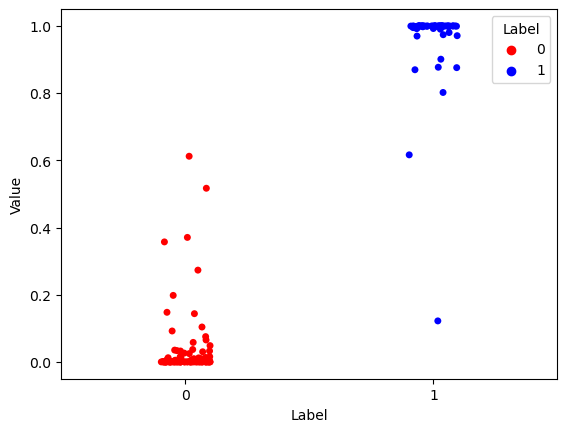

In [109]:
# looks great so far! Lets take a look at our probabilities and see if adjusting
# the threshold can improve our stats
# we need to improve the precision and recall for our model
# lets graph the probabilities colored by y_test
y_proba = model_scaled.predict_proba(scaled_X_test)
# probability of 2nd class (positive review)
data = {'Value': y_proba[:,1],
        'Label': y_test}
df = pd.DataFrame(data)

# Set up a custom color palette for the binary values (0 and 1)
palette = {0: 'red', 1: 'blue'}
# Plot the data as a bar chart with each column representing one feature value,
# and the hue indicating whether that observation is positive or negative

sns.stripplot(x='Label', y='Value', data=df, hue='Label', palette=palette)

In [122]:
# we technically can change the threshold to ~0.615 to remove one false positive
# lets do that! 

# Define your desired threshold
new_threshold = 0.615

# Manually classify based on the new threshold
y_pred_class = np.where(y_proba >= new_threshold, 1, 0)

In [123]:

from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test, y_pred_class[:,1]))
# Threshold: 0.5 -> 0.615
# TPs: 62 -> 62
# FPs: 2 -> 0
# FNs: 1 -> 1
# TNs: 106 -> 108


# accuracy: Accuracy = (TP + TN)/(TP + FP + TN + FN)
from sklearn.metrics import accuracy_score
print(accuracy_score(y_test, y_pred_class[:,1]))
# output: 0.9824561403508771 -> 0.9941520467836257

# precision: Precision = TP/(TP + FP)
from sklearn.metrics import precision_score
print(precision_score(y_test, y_pred_class[:,1]))
# output: 0.96875 -> 1.0

# recall: Recall = TP/(TP + FN)
from sklearn.metrics import recall_score
print(recall_score(y_test, y_pred_class[:,1]))
# output: 0.9841269841269841 -> 0.9841269841269841

# F1 score weighted average of precision and recall
from sklearn.metrics import f1_score
print(f1_score(y_test, y_pred_class[:,1]))
# output: 0.9763779527559054 -> 0.9919999999999999

[[108   0]
 [  1  62]]
0.9941520467836257
1.0
0.9841269841269841
0.9919999999999999
